<p style="text-align: center;"><b>DSA312 Data Science with Python</b></p>
<p style="text-align: center;"><b>Author: Jing Rong GOH</b></p>
<p style="text-align: center;"><b>Assignment 1</b></p>
<p style="text-align: center;"><b>Note: This assignment has 10 questions (10 marks each)</b></p>
<p style="text-align: center;"><b>Note: Points may be deducted for overly verbose or inefficient code. Bonus credit will be awarded for concise and elegant solutions.</b></p>

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### Q1. Use the diamonds dataset from Seaborn for this question
##### Q1a. Load the diamonds dataset and calculate the correlation between `price` and `carat`. 
##### Q1b. Display a scatter plot to visualize the relationship between `price` and `carat`, with plot title `Price vs Carat of Diamonds`. Describe the plot.
##### Q1c. Create a new column `price_per_carat` to calculate the price per carat for each diamond and display the first 10 rows. What is the `price_per_carat` for the 8th row?
##### Q1d. Visualize the distribution of `price_per_carat` across different `clarity` using a violin plot, with plot title `Price per Carat Distribution by Clarity`. What does the plot tell you about relationship between `price_per_carat` and `clarity`?
##### Q1e. Using plotly.express, create an interactive scatter plot of `price` vs. `carat`, colored by `clarity`, and add hover information to display `cut`. From your plot, what is the `price`, `carat`, `clarity`, and `cut` for the diamond with the 2nd largest `carat` value.

In [2]:
# Q1 Load Libraries Here
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
# Q1a
diamonds = sns.load_dataset("diamonds")
diamonds_subset = diamonds[["price", "carat"]]
diamonds_subset.corr()
# Answer: 0.921591

,price,carat
price,1.000000,0.921591
carat,0.921591,1.000000


<Axes: xlabel='carat', ylabel='price'>

Text(0.5, 1.0, 'Price vs Carat of Diamonds')

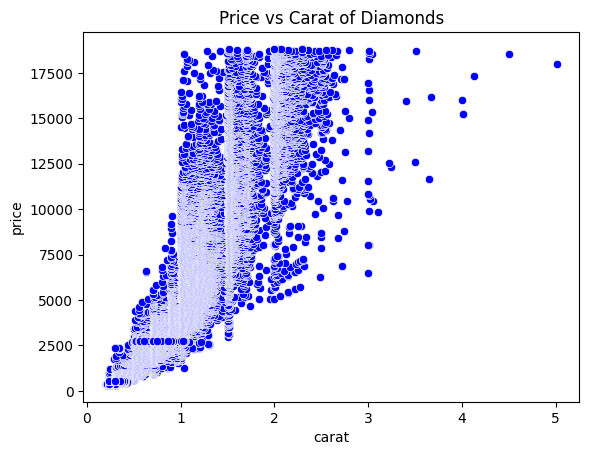

In [6]:
# Q1b
sns.scatterplot(x = 'carat', y = 'price', data = diamonds, color = 'blue')
plt.title("Price vs Carat of Diamonds")
plt.show()
# Answer: As carat size increases, the price generally increases. However, it seems that between 1 and 3 carats, the price can be
# as high as the price of 5-carat diamonds.

In [5]:
# Q1c
diamonds['price_per_carat'] = diamonds['price'] / diamonds['carat']
diamonds.head(10)
# Answer: $1296.153846

,carat,cut,color,clarity,depth,table,price,x,y,z,price_per_carat
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43,1417.391304
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31,1552.380952
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31,1421.739130
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63,1151.724138
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75,1080.645161
5,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48,1400.000000
6,0.24,Very Good,I,VVS1,62.3,57.0,336,3.95,3.98,2.47,1400.000000
7,0.26,Very Good,H,SI1,61.9,55.0,337,4.07,4.11,2.53,1296.153846
8,0.22,Fair,E,VS2,65.1,61.0,337,3.87,3.78,2.49,1531.818182
9,0.23,Very Good,H,VS1,59.4,61.0,338,4.00,4.05,2.39,1469.565217


<Axes: xlabel='clarity', ylabel='price_per_carat'>

Text(0.5, 1.0, 'Price per Carat Distribution by Clarity')

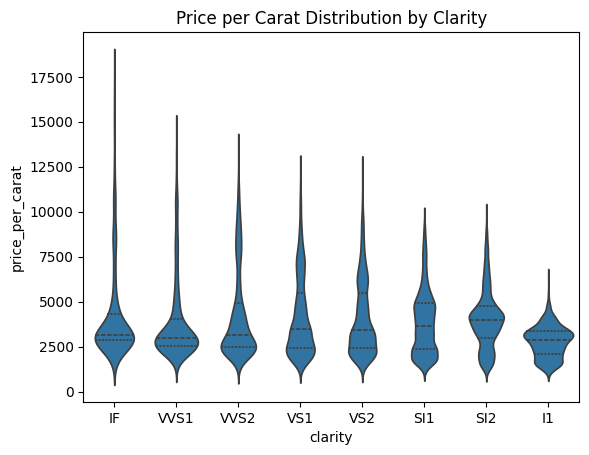

In [6]:
# Q1d
sns.violinplot(x = 'clarity',y = 'price_per_carat', data = diamonds
              ,inner = 'quartile')
plt.title("Price per Carat Distribution by Clarity")
plt.show()
# Answer:As we go from left to right for clarity type, the variation in the price per carat falls.

In [7]:
# Q1e
fig = px.scatter(diamonds, x = 'carat', y = 'price', color = 'clarity', hover_name = 'cut')
fig.show()
# Answer: Price: 18.531K , Clarity: I1, Carat: 4.5, Cut: Fair

### Q2. Use the tips dataset from Seaborn for this question
##### Q2a. Load the tips dataset and run a code that returns the following:
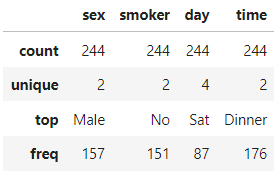

##### Q2b. Create a new feature `meal_time1` that categorizes tips into 'Morning' (when `time` is 'Lunch') or 'Evening' (when `time` is 'Dinner') using `numpy.where()`
##### Q2c. Create a new feature `meal_time2` that categorizes tips into 'Morning' (when `time` is 'Lunch') or 'Evening' (when `time` is 'Dinner') using two `loc[]`
##### Q2d. Between `numpy.where()` and `loc[]`, which approach is generally more efficient?
##### Q2e. Create a new column `tip_percentage` to calculate the `tip` as a percentage of `total_bill`. Use a groupby() to group the data by `time` and `smoker` and calculate the average `tip_percentage` per group. Which group tipped the most / least?

In [2]:
# Q2 Load Libraries Here
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [36]:
tips.columns

Index(['total_bill', 'tip', 'sex', 'smoker', 'day', 'time', 'size'], dtype='object')

In [38]:
# Q2a
tips = sns.load_dataset('tips')
categorical = tips[['sex', 'smoker', 'day', 'time']]
categorical.describe()

,sex,smoker,day,time
count,244,244,244,244
unique,2,2,4,2
top,Male,No,Sat,Dinner
freq,157,151,87,176


In [6]:
# Q2b
tips['meal_time1'] = np.where(tips['time'] == 'Lunch', 'Morning', 'Evening')

In [7]:
# Q2c
tips['meal_time2'] = None
tips.loc[tips['time'] == "Lunch", "meal_time2"] = "Morning"
tips.loc[tips['time'] == "Dinner", "meal_time2"] = "Evening"

In [15]:
# Q2d

# Answer: numpy is generally more efficient.

In [38]:
# Q2e.
tips['tip_percentage'] = tips['tip'] / tips['total_bill']
tips.groupby(['time','smoker'])['tip_percentage'].mean()
# Answer: Smokers during lunchtime tip the most. Non-smokers during dinner tip the least.

C:\Users\drago\AppData\Local\Temp\ipykernel_16148\100132394.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tips.groupby(['time','smoker'])['tip_percentage'].mean()


time    smoker
Lunch   Yes       0.170404
        No        0.160920
Dinner  Yes       0.160828
        No        0.158653
Name: tip_percentage, dtype: float64

### Q3. Use the penguins dataset from Seaborn for this question
##### Q3a. Load the penguins dataset and generate a default profile report using `ydata_profiling`. Use this profile report to answer the remaining questions.
##### Q3b. Check the distribution of `body_mass_g`. Is it normally distributed or skewed? If skewed, is it left-skewed or right-skewed?
##### Q3c. Which two variables exhibit the strongest negative correlation, and what is the value of this correlation? Which section of the profile report did you retrieve this information?
##### Q3d. What is the interquartile range for `bill_depth_mm`?
##### Q3e. Are there any other variable(s) that will always be missing when `bill_lenght_mm` is missing? If yes, which variable(s)? Explain how you arrived at your answer.

In [58]:
# Q3 Load Libraries Here
import seaborn as sns
from ydata_profiling import ProfileReport

In [59]:
# Q3a.
penguins = sns.load_dataset('penguins')
ProfileReport(penguins)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [60]:
# Q3b.

# Answer: Slightly Right Skewed

In [61]:
# Q3c.

# Answer: bill_length_mm and flipper_length_mm, -0.523. Correlations -> Table

In [62]:
# Q3d.

# Answer: 3.1

In [63]:
# Q3e.

# Answer: bill_depth_mm, flipper_length_mm, body_mass_g. From missing values -> heatmap, missing values of bill_length_mm is perfectly correlated
# with these 3 variables, displaying that they are also missing when this variable is missing.

### Q4. Only `numpy` library can be imported for this question
##### Q4a. First, create a 1D NumPy array of integers from 1 to 100. Then, use the `reshape` method to reshape this array into a 10x10 matrix. Finally, assign the transpose of this matrix to object `transpose_matrix` and display it.
##### Q4b. Replace all even numbers in `transpose_matrix` with 0, and display the updated `transpose_matrix`.
##### Q4c. Extract and display the subarray from the 2nd to 4th row and 3rd to 5th column of the `transpose_matrix`. What is the number at the center of this subarray?
##### Q4d. Create a second matrix of the same shape (i.e. 10x10) filled with random integers between 1 and 100, and assign this matrix to object `matrix2`. Using an appropriate function in numpy, set the seed value to 88 for this question to ensure reproducibility of solution. Display `matrix2`.
##### Q4e. Perform all these calculations in a single line of code: Compute the dot product of `matrix2` and `transpose_matrix` (i.e. `matrix2 ⋅ transpose_matrix`). After obtaining the dot product, calculate the mean of all the values in the resulting matrix. What is the mean value obtained?

In [40]:
# Q4 Load Libraries Here
import numpy as np

In [41]:
# Q4a.
array = np.arange(1,101)
array = np.reshape(array,[10,10])
transpose_matrix = np.transpose(array)
transpose_matrix

array([[  1,  11,  21,  31,  41,  51,  61,  71,  81,  91],
       [  2,  12,  22,  32,  42,  52,  62,  72,  82,  92],
       [  3,  13,  23,  33,  43,  53,  63,  73,  83,  93],
       [  4,  14,  24,  34,  44,  54,  64,  74,  84,  94],
       [  5,  15,  25,  35,  45,  55,  65,  75,  85,  95],
       [  6,  16,  26,  36,  46,  56,  66,  76,  86,  96],
       [  7,  17,  27,  37,  47,  57,  67,  77,  87,  97],
       [  8,  18,  28,  38,  48,  58,  68,  78,  88,  98],
       [  9,  19,  29,  39,  49,  59,  69,  79,  89,  99],
       [ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100]])

In [44]:
# Q4b.
transpose_matrix[transpose_matrix % 2 == 0] = 0
transpose_matrix

array([[ 1, 11, 21, 31, 41, 51, 61, 71, 81, 91],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 3, 13, 23, 33, 43, 53, 63, 73, 83, 93],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 5, 15, 25, 35, 45, 55, 65, 75, 85, 95],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 7, 17, 27, 37, 47, 57, 67, 77, 87, 97],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 9, 19, 29, 39, 49, 59, 69, 79, 89, 99],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0]])

In [47]:
# Q4c.
transpose_matrix[1:4,2:5]
# Answer: 33

array([[ 0,  0,  0],
       [23, 33, 43],
       [ 0,  0,  0]])

In [49]:
# Q4d.
np.random.seed(88)
matrix2 = np.random.randint(1, 101, (10,10))
matrix2

array([[ 89,  33,  80,  50,  21,  63,  98,  70,  49,  35],
       [ 98,  76,   5,  72,  91,  90,   8,  40,  71,  11],
       [ 87,  30,  14, 100,  78,   2,  41,  79,  79,  12],
       [ 17,  33,   6,  22,   4,  95,  90,  14,  48,  68],
       [ 47,  24,  78,  52,  42,  29,  64,  89,  22,  29],
       [ 81,  39,   1,  35,  76,  35,  93,  86,  76,  95],
       [ 26,  51,  62,  38,  55,  66,  50,  57,  87,  62],
       [ 79,  80,  82,  28,  50,   8,   5,  36,  87,  93],
       [ 71,   7,  47,  49,  84,  49,  95,  78,  19,  72],
       [ 74,  91,   7,  44,  45,  94,  84,  87,   7,  85]])

In [55]:
# Q4e.

np.dot(matrix2,transpose_matrix).mean()
# Answer: 13849.6

13849.6

### Q5. Use the tips dataset from Seaborn for this question
##### Q5a. Load the tips dataset into a pandas DataFrame. Filter the DataFrame to include only rows where the `total_bill` is greater than 20. How many rows meet this condition?
##### Q5b. Create a pivot table that shows the sum of `total_bill` for each `day` and `time`. From the pivot table, what is the sum of `total_bill` for `Dinner` on `Sat`?
##### Q5c. Use the `melt()` function to reshape the DataFrame to long format, such that it returns the following:
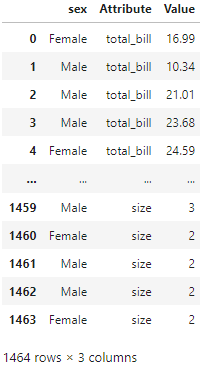
##### Q5d. Sort the DataFrame by `total_bill` in descending order and display the top 10 rows. What is the `total_bill` for the top row and what does it mean?
##### Q5e. What are the sample standard_deviation and population standard_deviation of `total_bill`? 

In [29]:
# Q5 Load Libraries Here
import seaborn as sns
import pandas as pd
import numpy as np

In [30]:
# Q5a.
tips = sns.load_dataset('tips')
len(tips.loc[tips['total_bill'] > 20])
# Answer: 97 rows

97

In [31]:
# Q5b.
tips.pivot_table(index = ['day','time'], values = 'total_bill',aggfunc ='sum', observed = False)
# Answer: $1778.40

total_bill
day  time              
Thur Lunch      1077.55
     Dinner       18.78
Fri  Lunch        89.92
     Dinner      235.96
Sat  Lunch         0.00
     Dinner     1778.40
Sun  Lunch         0.00
     Dinner     1627.16

In [32]:
# Q5c.
tips.melt(id_vars = 'sex', 
          value_vars = ['total_bill', 'tip', 'smoker', 'day', 'time', 'size'], 
          var_name = 'Attribute', 
          value_name = 'Value')

,sex,Attribute,Value
0,Female,total_bill,16.99
1,Male,total_bill,10.34
2,Male,total_bill,21.01
3,Male,total_bill,23.68
4,Female,total_bill,24.59
...,...,...,...
1459,Male,size,3
1460,Female,size,2
1461,Male,size,2
1462,Male,size,2


In [33]:
# Q5d.
tips.sort_values(['total_bill'], ascending = False).head(10)
# Answer: $50.81. The highest total bill recorded is $50.81

,total_bill,tip,sex,smoker,day,time,size
170,50.81,10.00,Male,Yes,Sat,Dinner,3
212,48.33,9.00,Male,No,Sat,Dinner,4
59,48.27,6.73,Male,No,Sat,Dinner,4
156,48.17,5.00,Male,No,Sun,Dinner,6
182,45.35,3.50,Male,Yes,Sun,Dinner,3
102,44.30,2.50,Female,Yes,Sat,Dinner,3
197,43.11,5.00,Female,Yes,Thur,Lunch,4
142,41.19,5.00,Male,No,Thur,Lunch,5
184,40.55,3.00,Male,Yes,Sun,Dinner,2
95,40.17,4.73,Male,Yes,Fri,Dinner,4


In [34]:
# Q5e.
tip_values = tips['total_bill'].values
np.std(tip_values)
np.std(tip_values, ddof = 1)
# Answer:  Population standard_deviation of total_bill: $8.884150577771132, Sample standard_deviation of total_bill: 8.902411954856856

8.884150577771132

8.902411954856856

### Q6. Use the titanic dataset from Seaborn for this question
##### Q6a. Load the titanic dataset into a pandas DataFrame. Split the titanic dataset into two separate DataFrames: `df1` containing columns [`pclass`, `sex`, `age`, `fare`] and `df2` containing columns [`sex`, `embarked`, `class`, `deck`]. Perform an inner merge on the `sex` column to merge `df1` and `df2`, and assign the merged result to `merged_df`. How many rows does `merged_df` contain?
##### Q6b. In a single line of code, utilize two different pandas methods to determine the number of missing values in each column of `merged_df`. Identify the column with the most missing values in `merged_df` and state how many missing values it contains.
##### Q6c. Replace the missing values in the column identified in `Q6b` with the column's most frequent value (mode), and display the resulting DataFrame. What is the column's most frequent value (mode)?
##### Q6d. Filter `merged_df` to display rows where `age` is greater than 30 and `fare` is above 50. How many rows meet these conditions?
##### Q6e. Group `merged_df` by `pclass` and calculate the mean and median of `fare` for each class. Display the results. Based on the output, identify the largest mean value and the smallest median value.

In [9]:
# Q6 Load Libraries Here
import pandas as pd
import seaborn as sns

In [10]:
# Q6a.
titanic = pd.DataFrame(sns.load_dataset("titanic"))
df1 = titanic[['pclass','sex','age','fare']]
df2 = titanic[['sex','embarked','class','deck']]
merged_df = pd.merge(df1,df2, how = 'inner' , on = 'sex')
len(merged_df)
# Answer: 431525

431525

In [11]:
# Q6b.
merged_df.isna().sum(); merged_df.isnull().sum()
# Answer: Deck has the most missing values, 339905 missing values.

pclass           0
sex              0
age          88190
fare             0
embarked       628
class            0
deck        339905
dtype: int64

pclass           0
sex              0
age          88190
fare             0
embarked       628
class            0
deck        339905
dtype: int64

In [38]:
# Q6c.
value_to_replace_with = merged_df['deck'].value_counts().idxmax()
merged_df.fillna({'deck' : value_to_replace_with}, inplace = True)
# Answer: deck C

In [39]:
# Q6d.
len(merged_df.loc[(merged_df['age'] > 30) & (merged_df['fare'] > 50)])
# Answer: 36056 rows

36056

In [60]:
# Q6e.
merged_df.groupby('pclass')['fare'].mean()
merged_df.groupby('pclass')['fare'].median()
# Answer: Largest mean is passenger class 1 and lowest median is passenger class 3.

pclass
1    78.718097
2    20.358829
3    13.298541
Name: fare, dtype: float64

pclass
1    53.10
2    13.50
3     8.05
Name: fare, dtype: float64

### Q7. Use the titanic dataset from Seaborn for this question
##### Q7a. Load the titanic dataset into a pandas DataFrame. Create a Python function `column_sum(df, column_name)` that accepts a DataFrame and a column name as arguments and returns the sum of all values in the specified column. Use this function on the titanic DataFrame to calculate the sum of the `fare` column. What is the resulting value, and what does this value represent?
##### Q7b. Define a Python function `categorize_age(age)` that accepts an age as input and returns a string: `Child` if the age is less than 18, `Adult` if the age is between 18 (inclusive) and 60 (exclusive), and `Senior` if the age is 60 or older. Apply this function to a test input value of 88. What is the output of the function? 
##### Q7c. Create a Python function `count_by_class_and_survived(df, pclass, survived)` that takes a DataFrame, a passenger class (`pclass`), and a survival status (`survived`) as inputs, and returns the count of passengers matching these criteria using control flow statements (`for` loops and `if` statements). (Hint: Utilize the `iterrows()` method in pandas to make your code concise). Apply this function to the titanic DataFrame to determine the total number of survivors in passenger class 2.

In [6]:
# Q7 Load Libraries Here
import seaborn as sns
import pandas as pd

In [7]:
# Q7a.
titanic = pd.DataFrame(sns.load_dataset("titanic"))
def column_sum(df, column_name):
    return df[column_name].sum()
column_sum(titanic, 'fare')
# Answer: $28693.9493. It is the total fare paid by passengers on Titanic

28693.9493

In [5]:
# Q7b.
def categorize_age(age):
    if age < 18:
        return 'Child'
    elif age >= 18 and age < 60:
        return 'Adult'
    else:
        return 'Senior'
categorize_age(88)
# Answer: 'Senior'

'Senior'

In [10]:
# Q7c.
def count_by_class_and_survived(df, pclass, survived):
    counter = 0
    for index, row in df.iterrows():
        if row['pclass'] == pclass and row['survived'] == survived:
            counter +=1
    return counter

count_by_class_and_survived(titanic, 2, 1)
    
# Answer: 88 passengers from passenger class 2 survived the titanic crash.

88

### Q8. Use the flights dataset from Seaborn for this question
##### Q8a. Load the flights dataset into a pandas DataFrame. In a single line of code, calculate the total number of passengers for each year and assign the result to a variable named `yearly_passengers`. Display the results. How many passengers were there in the year with the fewest total passengers?
##### Q8b. Create a line plot, with a figure size of (10, 6), showing the total number of passengers for each year. Set the line style to be dashed (--), set the line color to red, set the line width to 2, and use circle markers (o) for the data points.
##### Q8c. Building on your code from Q8b., add a legend to the plot with the label `Total Passengers`. Additionally, include a suitable title and labels for both the x-axis and y-axis.
##### Q8d. Building on your code from Q8c., add annotations to highlight the years with the highest and lowest total passengers on the plot. Use text (`Highest Point`, `Lowest Point`) and blue arrows to point to these data points. (Hint: Utilize the `idxmax()` and `idxmin()` methods in pandas to make your code concise).
##### Q8e. Building on your code from Q8d., enable grid lines on the plot and customize their color to light pink with a dashed (--) style. Change the background color of the plot to `#FFFFE0` (i.e. a light yellow). What observations can you make about the trend depicted in the plot?

In [7]:
# Q8 Load Libraries Here
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

In [15]:
# Q8a.
flights = pd.DataFrame(sns.load_dataset('flights'))
yearly_passengers = flights.groupby('year')['passengers'].sum()
yearly_passengers
yearly_passengers.idxmin()
# Answer: Year 1949

year
1949    1520
1950    1676
1951    2042
1952    2364
1953    2700
1954    2867
1955    3408
1956    3939
1957    4421
1958    4572
1959    5140
1960    5714
Name: passengers, dtype: int64

1949

<Figure size 1000x600 with 0 Axes>

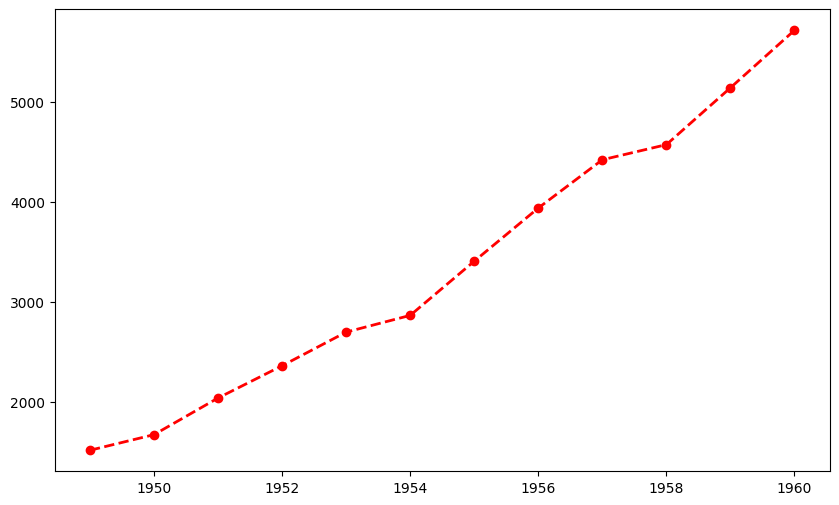

In [12]:
# Q8b.
plt.figure(figsize = (10,6))
plt.plot(yearly_passengers.index, yearly_passengers.values, linestyle = '--', color = 'red', linewidth = 2, marker = 'o')
plt.show()

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Total Yearly Flight Passengers from 1949 - 1960')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Total Passengers')

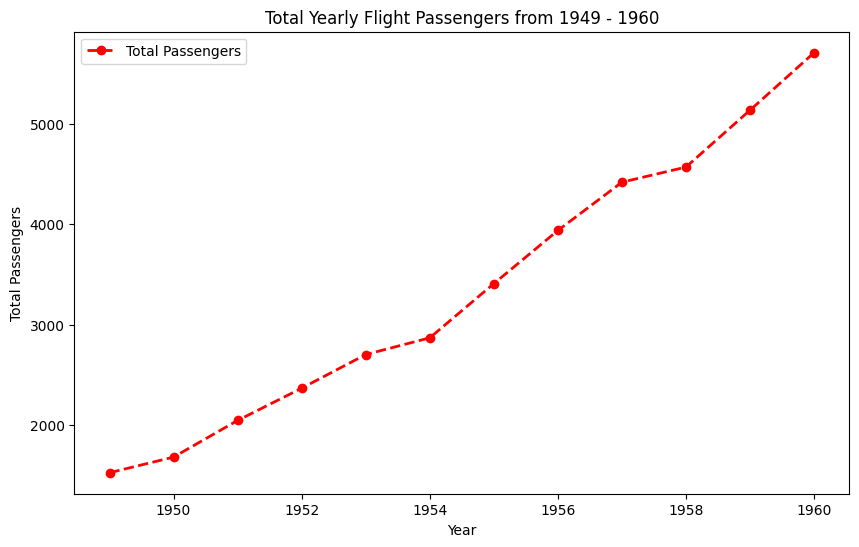

In [14]:
# Q8c.
plt.figure(figsize = (10,6))
plt.plot(yearly_passengers.index, yearly_passengers.values, linestyle = '--', color = 'red', linewidth = 2, marker = 'o', label = 'Total Passengers')
plt.title('Total Yearly Flight Passengers from 1949 - 1960')
plt.xlabel('Year')
plt.ylabel('Total Passengers')
plt.legend()
plt.show()

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Total Yearly Flight Passengers from 1949 - 1960')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Total Passengers')

Text(1960, 5914, 'Highest Point')

Text(1949, 1320, 'Lowest Point')

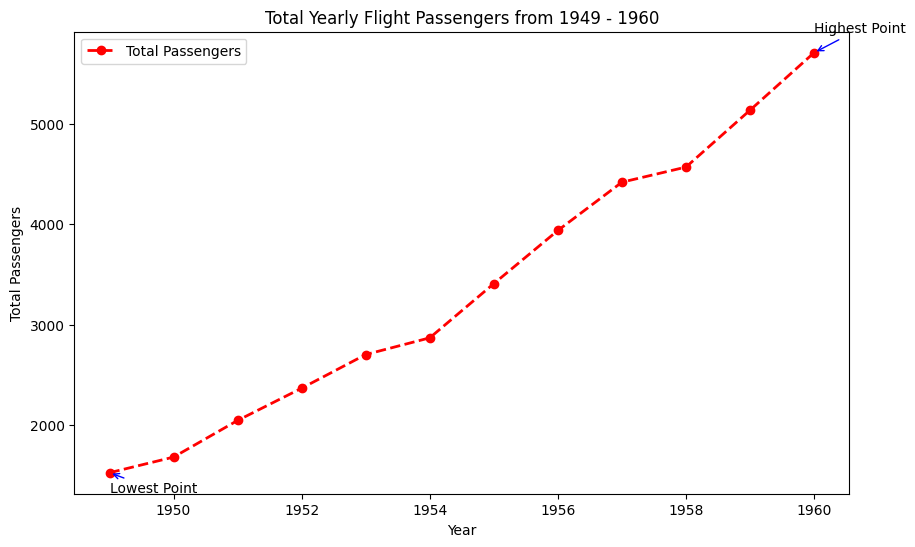

In [30]:
# Q8d.
max_passengers = yearly_passengers.max()
min_passengers = yearly_passengers.min()
max_passengers_index = yearly_passengers.idxmax()
min_passengers_index = yearly_passengers.idxmin()

plt.figure(figsize = (10,6))
plt.plot(yearly_passengers.index, yearly_passengers.values, linestyle = '--', color = 'red', linewidth = 2, marker = 'o', label = 'Total Passengers')
plt.title('Total Yearly Flight Passengers from 1949 - 1960')
plt.xlabel('Year')
plt.ylabel('Total Passengers')
plt.legend()
plt.annotate('Highest Point',
            xy = (max_passengers_index,max_passengers),
            xytext =(max_passengers_index, max_passengers+ 200),
             arrowprops = dict(color = 'blue', arrowstyle = '->')
            )
plt.annotate('Lowest Point',
            xy = (min_passengers_index,min_passengers),
            xytext =(min_passengers_index, min_passengers-200),
             arrowprops = dict(color = 'blue', arrowstyle = '->'),
            )
plt.show()

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Total Yearly Flight Passengers from 1949 - 1960')

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Total Passengers')

Text(1960, 5914, 'Highest Point')

Text(1949, 1320, 'Lowest Point')

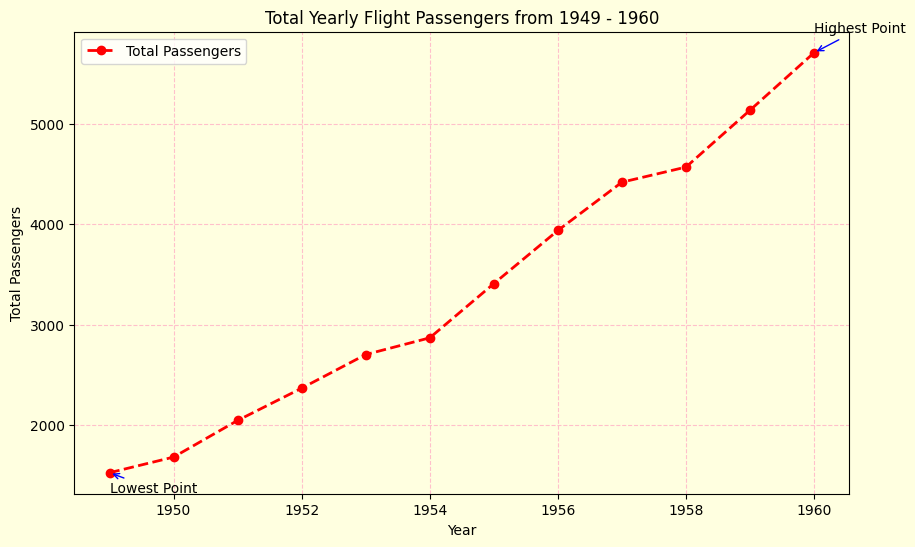

In [37]:
# Q8e.
max_passengers = yearly_passengers.max()
min_passengers = yearly_passengers.min()
max_passengers_index = yearly_passengers.idxmax()
min_passengers_index = yearly_passengers.idxmin()

plt.figure(figsize = (10,6), facecolor = '#FFFFE0')
plt.plot(yearly_passengers.index, yearly_passengers.values, linestyle = '--', color = 'red', linewidth = 2, marker = 'o', label = 'Total Passengers')
plt.title('Total Yearly Flight Passengers from 1949 - 1960')
plt.xlabel('Year')
plt.ylabel('Total Passengers')
plt.legend()
plt.grid(linestyle = '--', color = 'pink')
plt.annotate('Highest Point',
            xy = (max_passengers_index,max_passengers),
            xytext =(max_passengers_index, max_passengers+ 200),
             arrowprops = dict(color = 'blue', arrowstyle = '->')
            )
plt.annotate('Lowest Point',
            xy = (min_passengers_index,min_passengers),
            xytext =(min_passengers_index, min_passengers-200),
             arrowprops = dict(color = 'blue', arrowstyle = '->'),
            )

ax = plt.gca()
ax.set_facecolor('#FFFFE0') 

plt.show()

# Answer: As the years went by, the number of yearly flight passengers steadily increased.

### Q9. Use the titanic dataset from Seaborn for this question.
##### Q9a. Load the titanic dataset into a pandas DataFrame. Create a FacetGrid to visualize the `age` distribution across different passenger classes (`pclass`) and survival status (`survived`). Use `sns.histplot` to plot histograms on the FacetGrid, setting the `binwidth` to 5 for a clearer view of the distribution. Set the plot color to black. Apply additional customizations to achieve the desired appearance below:
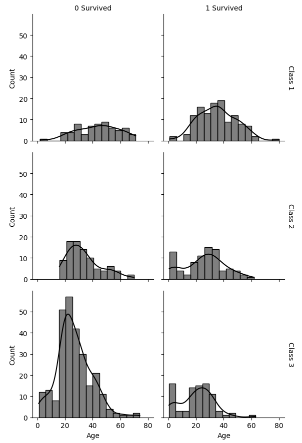 
##### Q9b. What are some observations that you can make from the plot in Q9a?
##### Q9c. Load the titanic dataset into a pandas DataFrame. Create an enhanced violin plot to visualize the distribution of passenger `age` across different passenger classes (`pclass`) and survival statuses (`survived`). Use a figure size of (10,6). Set the palette to `muted`. Apply additional customizations to achieve the desired appearance below:
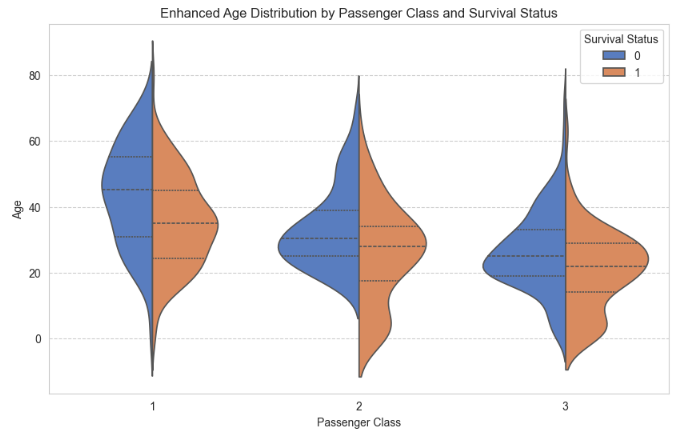
##### Q9d. What are some observations that you can make from the plot in Q9c?

In [51]:
# Q9 Load Libraries Here
import seaborn as sns
import pandas as pd

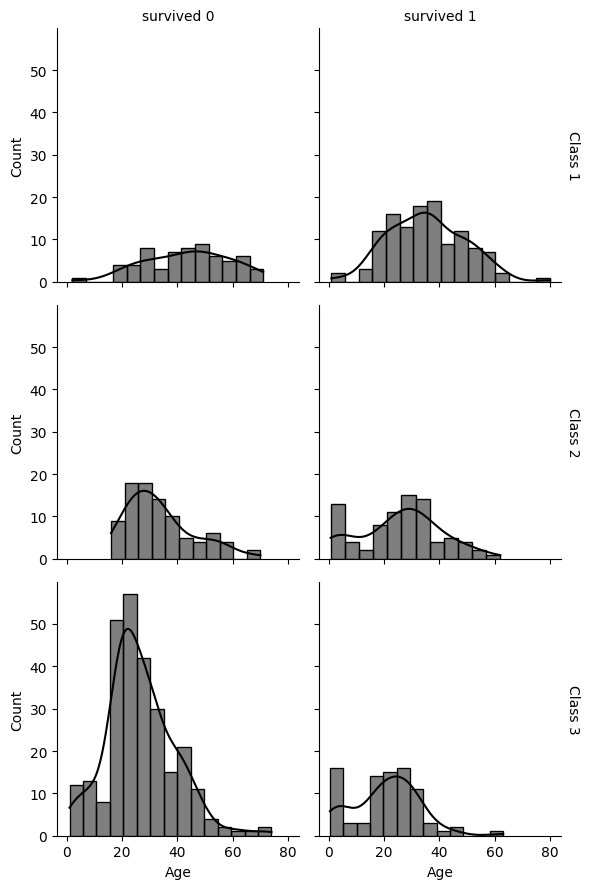

In [42]:
# Q9a.
titanic = pd.DataFrame(sns.load_dataset('titanic'))

g = sns.FacetGrid(titanic, row = 'pclass', col = 'survived', margin_titles = True)
g.map(sns.histplot, 'age', binwidth = 5, color = 'black', kde = True)
g.set_axis_labels('Age','Count')

g.set_titles(col_template="survived {col_name}", row_template="Class {row_name}")

In [56]:
# Q9b.

# Answer: The proportion of passengers who survived compared to the total number of passengers in a particular class decreases as we go from pclass = 1
# to pclass = 3. We can see that more than 50% of pclass = 1 survived, but about 80 % of pclass = 3 did not survive.

In [46]:
titanic

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='pclass', ylabel='age'>

Text(0.5, 0, 'Passenger Class')

Text(0, 0.5, 'Age')

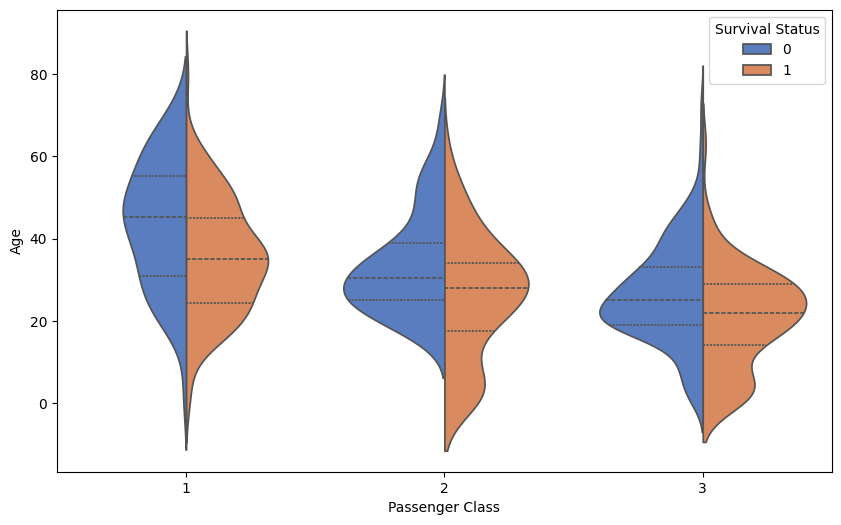

In [54]:
# Q9c.
titanic = pd.DataFrame(sns.load_dataset('titanic'))

plt.figure(figsize = (10,6))
sns.violinplot(x = 'pclass', y = 'age', data = titanic, hue = 'survived', palette = 'muted', split = True, inner = 'quartile')
plt.xlabel('Passenger Class')
plt.ylabel('Age')
plt.legend(title = 'Survival Status')


In [55]:
# Q9d.

# Answer: Passenger class 1 has on average, older passengers as compared to passenger class 2 and 3. Passneger class 1 has the oldest person on board.
# Age distribution in passenger class 2 and 3 is not very different form each other. 

### Q10. Use the iris dataset from Seaborn for this question.
##### Q10a. Load the iris dataset into a pandas DataFrame. Using Plotly Express, create a scatter plot to visualize the relationship of `sepal_width` against `sepal_length` from the iris dataset. Color the data points by species. Add a title `Scatter Plot of Sepal Dimensions by Species` to the plot.
##### Q10b. Based on the interactive plot in Q10a, which species has the longest `sepal_length`, and what is the value of that `sepal_length`? Similarly, which species has the shortest `sepal_width`, and what is the value of that `sepal_width`?

In [100]:
# Q10 Load Libraries Here
import seaborn as sns
import plotly.express as px

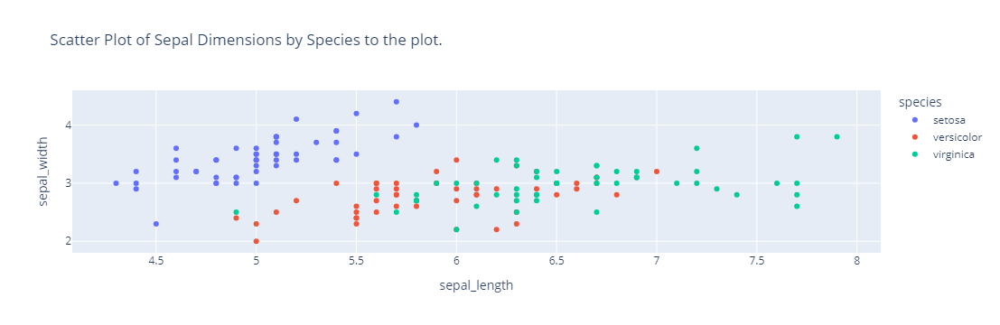

In [57]:
# 10a.
iris = pd.DataFrame(sns.load_dataset('iris'))
px.scatter(iris, x = 'sepal_length', y = 'sepal_width', color = 'species', title = 'Scatter Plot of Sepal Dimensions by Species to the plot.')

In [58]:
# Q10b.
# Answer: Virginica has the longest sepal length, at 7.9cm. Versicolor has the shortest sepal width, at 2cm.